In [8]:
import os
import matplotlib.pyplot as plt
import numpy as np
from itertools import product

In [29]:
widths = [.075, .035, .00]  # Hide seconds.
lengths = [.6, .85, 1]
colors = plt.cm.gray(np.linspace(0, 1, 4))[0:3]
factor = [12, 60, 60, 1]

# Mess with this to get bigger/smaller images (in pixels). Note that both the
# dpi and figure size matters. These settings produce a 57x57 image.
fig_size = 5
fig_dpi = 14

In [30]:
def time_to_radians(time):
    rads = [0, 0, 0]
    time += (0, )  # Pad with zero in milliseconds place.
    for i in range(3):
        rads[i] = 2 * np.pi * (float(time[i]) / factor[i] +
                               float(time[i + 1]) /
                               factor[i + 1] / factor[i])

        rads[i] -= (widths[i] / 2)
    return rads

In [31]:
def create_clock(times):
    plt.rcParams['toolbar'] = 'None'
    fig = plt.figure(figsize=(fig_size, fig_size), facecolor='w')
    ax = plt.subplot(111, polar=True)
    ax.get_yaxis().set_visible(False)

    # 12 labels, clockwise
    marks = np.linspace(360. / 12, 360, 12, endpoint=True)
    ax.set_thetagrids(marks, map(lambda m: int(m / 30), marks), #frac=.85, -> frac wird von Matplotlib nicht mehr unterstützt
                      size='small')
    ax.set_theta_direction(-1)
    ax.set_theta_offset(np.pi / 2)
    ax.grid(False) #True erstellt bei jeder Stunde eine Linie

    # These are the clock hands. We update the coordinates later.
    bars = ax.bar(time_to_radians(times), lengths, width=widths, bottom=0.0, color=colors, linewidth=0)#[2.0, 1.0, 0.0]

    return fig, ax, bars

In [32]:
def save_clock(fig, directory, time):
    fname = os.path.join(directory, 'clock6-{:02d}.{:02d}.{:02d}.png'.format(*time))
    fig.savefig(fname, bbox_inches='tight', dpi=14)
    return fname

In [33]:
dir_name = 'clocks'
index_fname = 'clocks_all.txt'

if not os.path.isdir(dir_name):
        os.mkdir(dir_name)
        print('Created directory {}.'.format(dir_name))

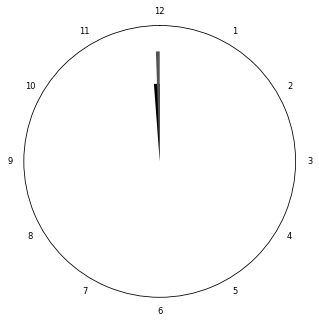

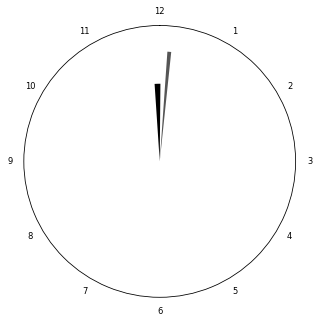

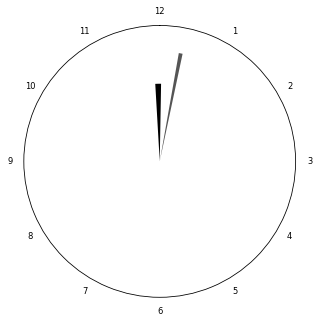

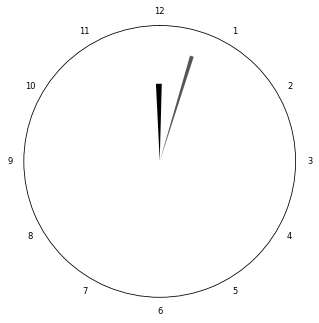

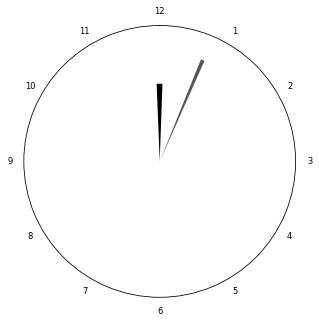

...

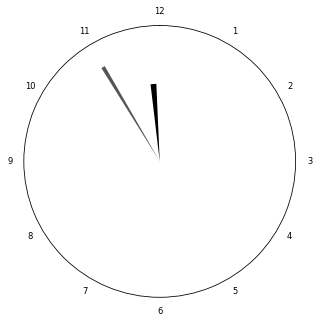

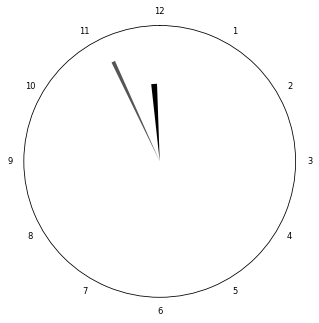

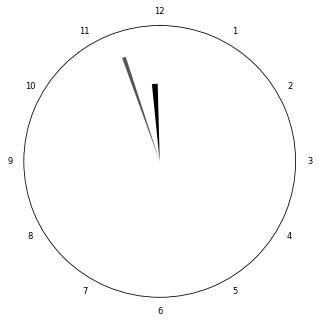

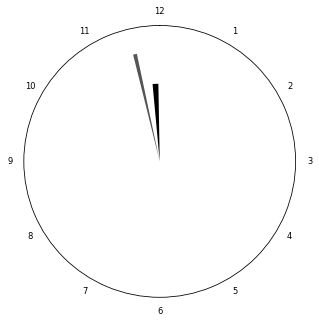

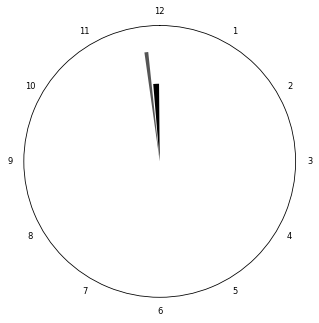

Created 720 clocks.


In [34]:
hours = range(0, 12) #12
minutes = range(0, 60) #60
seconds = [0]
times = [x for x in product(hours, minutes, seconds)]

with open(index_fname, 'w') as index_file:
    for t in times:
        fig, ax, bars = create_clock(t)
        #print('Generating clock for time: {}'.format(t))
        clock_fname = save_clock(fig, dir_name, t)
        index_str = '{}\t{}\t{}\n'.format(clock_fname, t[0], t[1])
        index_file.write(index_str)
        plt.show()
print('Created {} clocks.'.format(len(times)))